In [3]:
import luigi
import requests
import json
from pymongo import MongoClient
import pandas as pd
from scipy import stats
from sklearn.preprocessing import MinMaxScaler  # Add this import statement
import http.client
import json
import pandas as pd
from pymongo import MongoClient
from sklearn.preprocessing import MinMaxScaler  # Add this import statement
from scipy import stats
import numpy as np
from scipy.stats import ttest_ind, chi2_contingency
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from scipy.stats import zscore
import matplotlib.pyplot as plt
import seaborn as sns

# Data Uploading
1)Drugs Over Dose,
2)DeathRelatedDrug,
3)AppointmentDetails

In [4]:


class FetchAPIData(luigi.Task):
    """
    Task to fetch data from a URL and save to a file.
    """
    file_name = luigi.Parameter()
    data_url = luigi.Parameter()  # This will be the URL where the JSON data is stored

    def run(self):
        # Fetch data from URL
        response = requests.get(self.data_url)
        data = response.json()  # Parse JSON data directly from response
        
        # Save data to a file
        with self.output().open('w') as f:
            json.dump(data, f, indent=4)
        print(f"Data successfully saved to {self.file_name}")

    def output(self):
        return luigi.LocalTarget(self.file_name)

class UploadDataToMongoDB(luigi.Task):
    """
    Task to upload data from a file to MongoDB.
    """
    file_name = luigi.Parameter()
    db_name = luigi.Parameter()
    collection_name = luigi.Parameter()
    file_type = luigi.Parameter(default='json')

    def requires(self):
        return FetchAPIData(
            file_name=self.file_name, 
            data_url="https://raw.githubusercontent.com/x22247734/HealthCareAnalystData/main/drugs_overdose_data.json"
        )

    def run(self):
        client = MongoClient('mongodb://localhost:27017/')
        db = client[self.db_name]
        collection = db[self.collection_name]
        
        try:
            with self.input().open('r') as file:
                if self.file_type == 'json':
                    data = json.load(file)
                elif self.file_type == 'csv':
                    df = pd.read_csv(file)
                    data = df.to_dict('records')
                else:
                    raise ValueError("Unsupported file type. Use 'json' or 'csv'.")
            
            if isinstance(data, list):
                collection.insert_many(data)
            else:
                collection.insert_one(data)
            
            print(f"Data successfully uploaded to MongoDB in the '{self.collection_name}' collection")
        except Exception as e:
            print(f"Failed to upload data to MongoDB from file {self.file_name}: {e}")

    def output(self):
        return luigi.LocalTarget(self.file_name + ".done")

# Example usage within a Luigi scheduler:
if __name__ == '__main__':
    luigi.build([
        UploadDataToMongoDB(
            file_name='drug_overdose.json', 
            db_name='HealthCare', 
            collection_name='DrugsOverDose', 
            file_type='json'
        ),
        UploadDataToMongoDB(
            file_name='DeathReleatedDrug.json', 
            db_name='HealthCare', 
            collection_name='DeathRelatedDrug', 
            file_type='json'
        ),
        UploadDataToMongoDB(
            file_name='appointment_details.csv', 
            db_name='HealthCare', 
            collection_name='AppointmentDetails', 
            file_type='csv'
        )
    ])


DEBUG: Checking if UploadDataToMongoDB(file_name=drug_overdose.json, db_name=HealthCare, collection_name=DrugsOverDose, file_type=json) is complete
DEBUG: Checking if FetchAPIData(file_name=drug_overdose.json, data_url=https://raw.githubusercontent.com/x22247734/HealthCareAnalystData/main/drugs_overdose_data.json) is complete
INFO: Informed scheduler that task   UploadDataToMongoDB_DrugsOverDose_HealthCare_drug_overdose_js_00f5bb15d1   has status   PENDING
INFO: Informed scheduler that task   FetchAPIData_https___raw_gith_drug_overdose_js_4e7f65c608   has status   DONE
DEBUG: Checking if UploadDataToMongoDB(file_name=DeathReleatedDrug.json, db_name=HealthCare, collection_name=DeathRelatedDrug, file_type=json) is complete
DEBUG: Checking if FetchAPIData(file_name=DeathReleatedDrug.json, data_url=https://raw.githubusercontent.com/x22247734/HealthCareAnalystData/main/drugs_overdose_data.json) is complete
INFO: Informed scheduler that task   UploadDataToMongoDB_DeathRelatedDrug_HealthCare_

Data successfully uploaded to MongoDB in the 'DrugsOverDose' collection
Data successfully uploaded to MongoDB in the 'DeathRelatedDrug' collection


INFO: [pid 88985] Worker Worker(salt=1380234225, workers=1, host=Priyankas-MacBook-Pro.local, username=priyankabundela, pid=88985) done      UploadDataToMongoDB(file_name=appointment_details.csv, db_name=HealthCare, collection_name=AppointmentDetails, file_type=csv)
DEBUG: 1 running tasks, waiting for next task to finish
INFO: Informed scheduler that task   UploadDataToMongoDB_AppointmentDetai_HealthCare_appointment_deta_cdc625b9c3   has status   DONE
DEBUG: Asking scheduler for work...
DEBUG: Done
DEBUG: There are no more tasks to run at this time
INFO: Worker Worker(salt=1380234225, workers=1, host=Priyankas-MacBook-Pro.local, username=priyankabundela, pid=88985) was stopped. Shutting down Keep-Alive thread
INFO: 
===== Luigi Execution Summary =====

Scheduled 6 tasks of which:
* 3 complete ones were encountered:
    - 3 FetchAPIData(file_name=DeathReleatedDrug.json, data_url=https://raw.githubusercontent.com/x22247734/HealthCareAnalystData/main/drugs_overdose_data.json) ...
* 3 ran 

Data successfully uploaded to MongoDB in the 'AppointmentDetails' collection


# DataSet 2 : A story of growing opiod abuse
#### Author : Shivani Nityanand Shedole
x22218688@student.ncirl.ie

## ETL Process:

In [339]:
# Replace 'HealthCare' and 'DrugsOverDose' with your actual database and collection names
data_list = extract_and_transform_data_from_mongodb('HealthCare', 'DeathRelatedDrug')

# Create a pandas DataFrame from the list of records
data_drd = pd.DataFrame(data_list)


In [340]:
# Replace 'HealthCare' and 'DeathRelatedDrug' with your actual database and collection names
data_list = extract_and_transform_data_from_mongodb('HealthCare', 'DeathRelatedDrug')

# Create a pandas DataFrame from the list of records
data_drd = pd.DataFrame(data_list)

# Standardize column names
data_drd.columns = [x.lower().replace(' ', '_') for x in data_drd.columns]

# Display the first few rows of the DataFrame
data_drd.head()


,_id,casenumber,date,sex,race,age,residence_city,residence_state,residence_county,death_city,...,benzodiazepine,methadone,amphet,tramad,morphine_(not_heroin),other,any_opioid,mannerofdeath,amendedmannerofdeath,deathloc
0,663103c20fdf58e227ada668,13-16336,11/09/2013,Female,White,53,GROTON,,NEW LONDON,GROTON,...,Y,,,,,,,Accident,,"GROTON, CT\n(41.343693, -72.07877)"
1,663103c20fdf58e227ada669,12-18447,12/29/2012,Male,White,30,WOLCOTT,,NEW HAVEN,WATERBURY,...,,,,,,,,Accident,,"WATERBURY, CT\n(41.554261, -73.043069)"
2,663103c20fdf58e227ada66a,14-2758,02/18/2014,Male,White,43,ENFIELD,,,ENFIELD,...,Y,,,,,,,Accident,,"ENFIELD, CT\n(41.976501, -72.591985)"
3,663103c20fdf58e227ada66b,14-13497,09/07/2014,Female,White,24,WALLINGFORD,,,WALLINGFORD,...,,,,,,,,Accident,,"WALLINGFORD, CT\n(41.454408, -72.818414)"
4,663103c20fdf58e227ada66c,13-14421,10/04/2013,Female,White,26,WEST HAVEN,,NEW HAVEN,WEST HAVEN,...,,,,,,,,Accident,,"WEST HAVEN, CT\n(41.272336, -72.949817)"


In [341]:
# Define drug types and positive flag types
drug_types = ['heroin', 'cocaine', 'fentanyl', 'oxycodone', 'oxymorphone', 'etoh',
              'hydrocodone', 'benzodiazepine', 'methadone', 'amphet', 'tramad',
              'morphine_(not_heroin)', 'any_opioid']
positive_flag_types = ['Y', 'y', ' Y', '1']

# Process drug columns into binary flags and create an extra column for drug type
data_drd['drug_type'] = 'other'
for drug in drug_types:
    data_drd.loc[~data_drd[drug].isin(positive_flag_types), drug] = 0
    data_drd.loc[data_drd[drug].isin(positive_flag_types), drug] = 1
    data_drd[drug] = data_drd[drug].astype(np.int8)
    data_drd.loc[data_drd[drug] == 1, 'drug_type'] = drug


In [342]:
print(data_drd.columns)

Index(['_id', 'casenumber', 'date', 'sex', 'race', 'age', 'residence_city',
       'residence_state', 'residence_county', 'death_city', 'death_state',
       'death_county', 'location', 'descriptionofinjury', 'injuryplace',
       'immediatecausea', 'heroin', 'cocaine', 'fentanyl', 'oxycodone',
       'oxymorphone', 'etoh', 'hydrocodone', 'benzodiazepine', 'methadone',
       'amphet', 'tramad', 'morphine_(not_heroin)', 'other', 'any_opioid',
       'mannerofdeath', 'amendedmannerofdeath', 'deathloc', 'drug_type'],
      dtype='object')


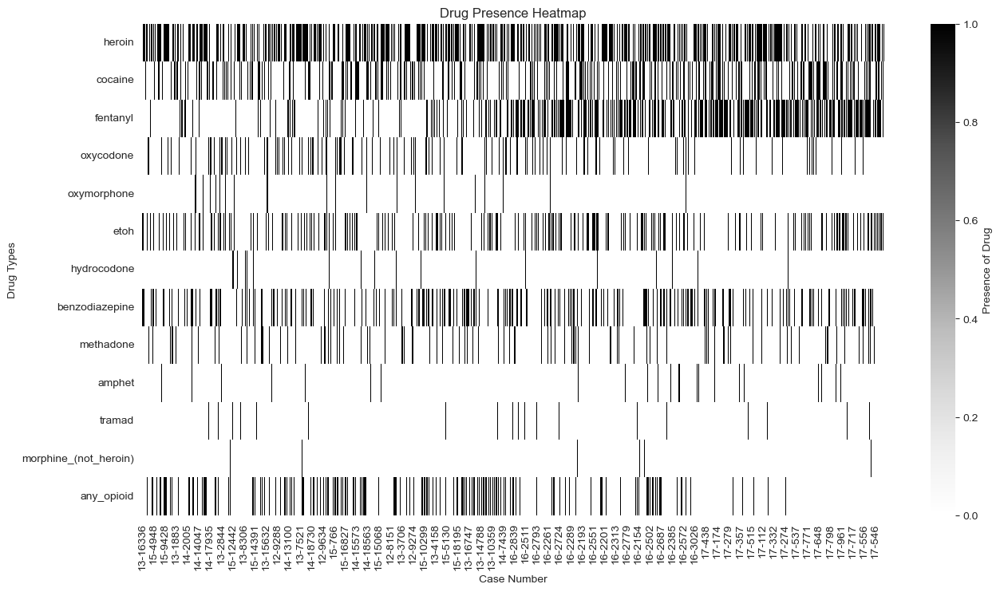

In [343]:
# Assuming data_drd is your processed DataFrame with binary flags for drug types
# Make sure that 'case_number' is the correct column name after standardizing
# Also, ensure that the drug_types list matches the column names in your DataFrame

# Create a subset DataFrame for visualization
data_for_heatmap = data_drd.set_index('casenumber')[drug_types]

# Generate the heatmap
plt.figure(figsize=(15, 8))  # Adjust the size to fit your data
sns.heatmap(data_for_heatmap.T, cmap="Greys", cbar_kws={'label': 'Presence of Drug'})
plt.title("Drug Presence Heatmap")
plt.xlabel("Case Number")
plt.ylabel("Drug Types")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()


In [344]:
print(data_drd['deathloc'].head())


0          GROTON, CT\n(41.343693, -72.07877)
1      WATERBURY, CT\n(41.554261, -73.043069)
2        ENFIELD, CT\n(41.976501, -72.591985)
3    WALLINGFORD, CT\n(41.454408, -72.818414)
4     WEST HAVEN, CT\n(41.272336, -72.949817)
Name: deathloc, dtype: object


In [345]:
# Extract latitude using a regular expression that captures numbers (with a decimal point)
# that come after an opening parenthesis and before a comma
data_drd['deathloc_latitude'] = data_drd['deathloc'].str.extract(r'\((\d+\.\d+),', expand=True).astype(np.float32)

# Extract longitude using a regular expression that captures numbers (with a decimal point)
# that come after a comma and space and before a closing parenthesis
data_drd['deathloc_longitude'] = data_drd['deathloc'].str.extract(r',\s*(-?\d+\.\d+)\)', expand=True).astype(np.float32)


In [346]:
import folium

# Assuming data_drd has been previously defined and has the required latitude and longitude columns
# Create map around the mean position
central_position = [data_drd['deathloc_latitude'].mean(), data_drd['deathloc_longitude'].mean()]
locations_map = folium.Map(location=central_position, zoom_start=9)

# Colors for the different drug types
palette = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'darkblue', 'darkgreen', 'cadetblue', 
           'darkpurple', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

# Add markers to the map according to their drug type
for i, drug in enumerate(data_drd['drug_type'].unique()):
    
    # Create a subset DataFrame for the specific drug
    drug_df = data_drd[data_drd['drug_type'] == drug]
    
    # Not interested in adding markers for 'other'
    if drug == 'other':
        continue
        
    # Use modulo to avoid IndexError if there are more drug types than colors
    color_index = i % len(palette)
    
    # Add markers for the drug type, limiting to the first 30 cases
    for case in drug_df.index[:30]:
        folium.Marker(
            location=[drug_df.loc[case, 'deathloc_latitude'], drug_df.loc[case, 'deathloc_longitude']],
            popup=f'{drug} ({case})',  # Include case number in popup
            icon=folium.Icon(color=palette[color_index])
        ).add_to(locations_map)

# Show the map
locations_map


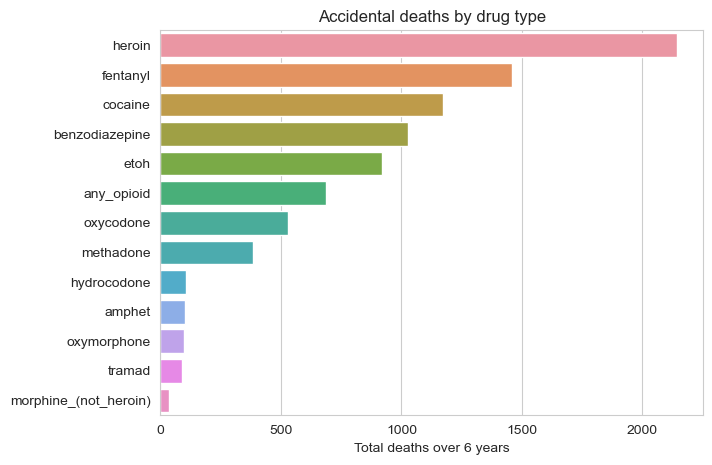

In [347]:
deaths_by_drug = data_drd[drug_types].sum().sort_values(ascending=False)
fig, ax = plt.subplots(1, 1, figsize=[7, 5])
sns.barplot(x=deaths_by_drug, y=deaths_by_drug.index)
ax.set_xlabel('Total deaths over 6 years')
ax.set_title('Accidental deaths by drug type')
plt.show()

In [348]:
data_drd['date'] = pd.to_datetime(data_drd['date'], infer_datetime_format=True)
data_drd['year'] = data_drd['date'].dt.year
data_drd['year_month'] = data_drd['date'].dt.to_period('M')


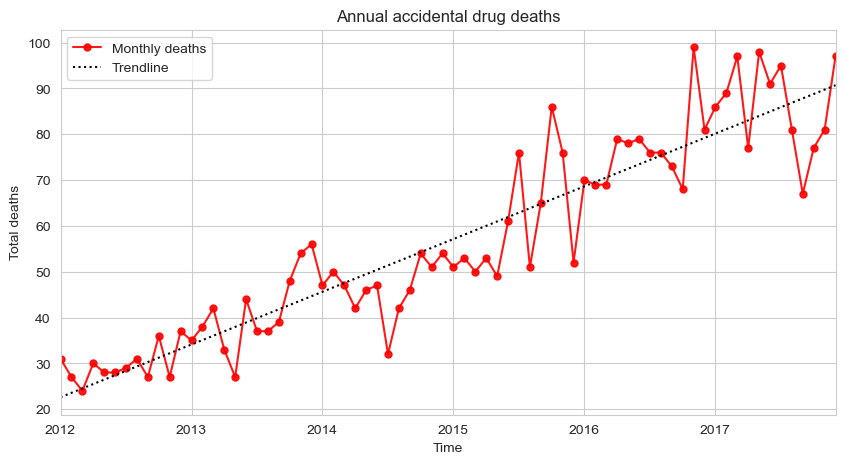

In [349]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LinearRegression

# Calculate annual deaths
annual_deaths = data_drd.groupby('year_month')['date'].count()

# Create figure and axis
fig, ax = plt.subplots(1, 1, figsize=[10, 5])

# Fit linear regression
lr = LinearRegression().fit(pd.to_numeric(annual_deaths.index).values.reshape(-1, 1), 
                            annual_deaths.values.reshape(-1, 1))
trendline = lr.predict(pd.to_numeric(annual_deaths.index).values.reshape(-1, 1))

# Plot monthly deaths
annual_deaths.plot(ax=ax, marker='o', ls='-', alpha=.9, markersize=5, color='r', label='Monthly deaths')

# Plot trendline
ax.plot(annual_deaths.index, trendline, ls=':', color='k', label='Trendline')

# Set labels and title
ax.set_ylabel('Total deaths')
ax.set_xlabel('Time')
ax.set_title('Annual accidental drug deaths')

# Add legend
ax.legend()

# Show plot
plt.show()


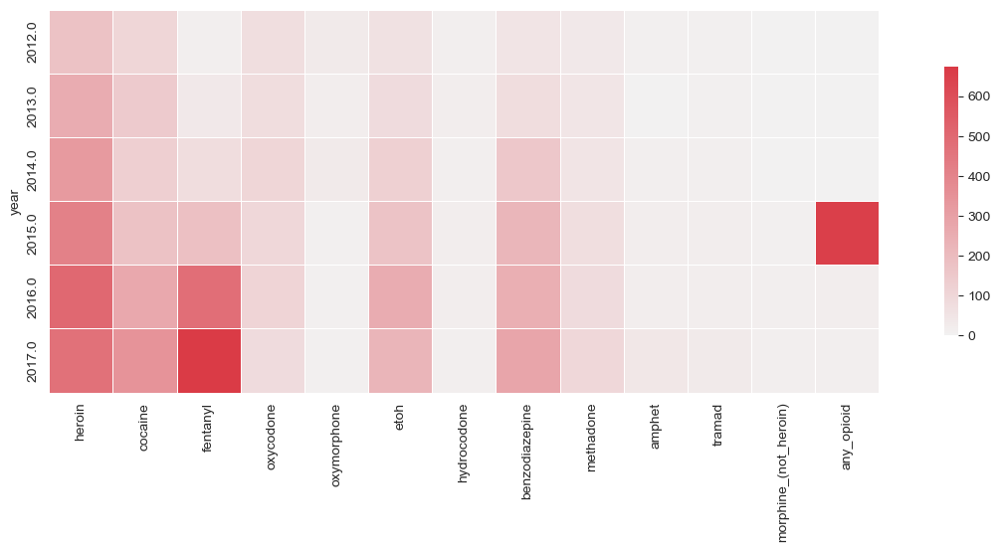

In [350]:
time_trends_by_drug = data_drd.groupby(by=['year'])[drug_types].sum()

#TODO ROTATE PLOT
fig, ax = plt.subplots(1, 1, figsize=[17, 5])
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(data=time_trends_by_drug, square=True, cmap=cmap, center=0,
            linewidths=.5, cbar_kws={"shrink": .7}, ax=ax)
plt.show()

In [351]:
most_frequent_drugs = data_drd[:5].index
frequent_drugs_df = data_drd[data_drd['drug_type'].isin(most_frequent_drugs)]


In [352]:
# Calculate the most frequent drugs
most_frequent_drugs = data_drd['drug_type'].value_counts().head(5).index

# Print the most frequent drugs
print("Most frequent drugs:")
print(most_frequent_drugs)

# Filter the DataFrame to include only rows where the drug type is among the most frequent drugs
frequent_drugs_df = data_drd[data_drd['drug_type'].isin(most_frequent_drugs)]

# Print the corresponding rows in the DataFrame
print("\nRows corresponding to the most frequent drugs:")
print(frequent_drugs_df)


Most frequent drugs:
Index(['any_opioid', 'fentanyl', 'benzodiazepine', 'etoh', 'heroin'], dtype='object')

Rows corresponding to the most frequent drugs:
                           _id casenumber       date     sex             race  \
0     663103c20fdf58e227ada668   13-16336 2013-11-09  Female            White   
2     663103c20fdf58e227ada66a    14-2758 2014-02-18    Male            White   
3     663103c20fdf58e227ada66b   14-13497 2014-09-07  Female            White   
4     663103c20fdf58e227ada66c   13-14421 2013-10-04  Female            White   
5     663103c20fdf58e227ada66d   13-18018 2013-12-10  Female            White   
...                        ...        ...        ...     ...              ...   
4074  663103c20fdf58e227adb652     17-691 2017-08-20    Male  Hispanic, White   
4076  663103c20fdf58e227adb654     17-618 2017-07-24    Male  Hispanic, White   
4077  663103c20fdf58e227adb655     17-665 2017-08-12  Female  Hispanic, White   
4078  663103c20fdf58e227adb656     

/var/folders/g3/vnvm9bv503z9yknsv61s9m_80000gn/T/ipykernel_88985/2983664417.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frequent_drugs_df['age'] = pd.to_numeric(frequent_drugs_df['age'], errors='coerce')


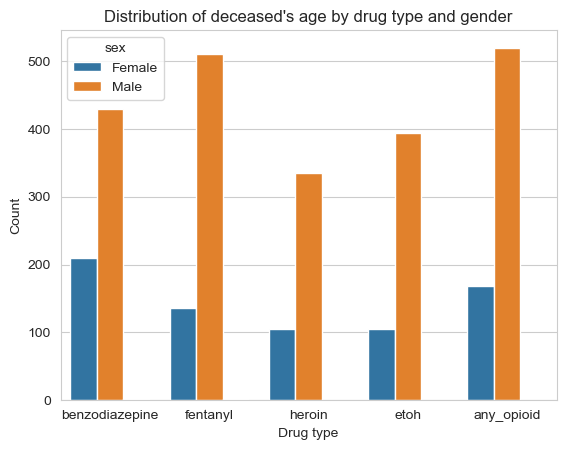

In [353]:
# Convert 'age' column to numeric if it's not already numeric
frequent_drugs_df['age'] = pd.to_numeric(frequent_drugs_df['age'], errors='coerce')

# Plot the data using Seaborn's countplot
sns.countplot(x='drug_type', hue='sex', data=frequent_drugs_df)

# Set labels and title
plt.xlabel('Drug type')
plt.ylabel('Count')
plt.title("Distribution of deceased's age by drug type and gender")

# Show plot
plt.show()


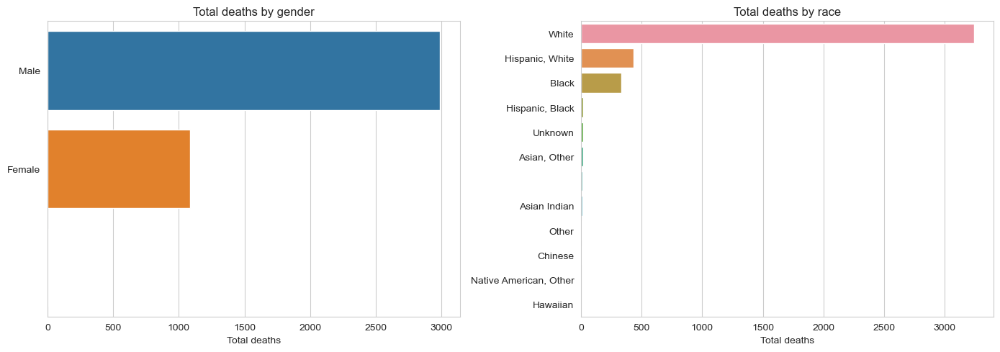

In [354]:
gender_counts = data_drd['sex'].value_counts()
race_counts = data_drd['race'].value_counts()
fig, (ax, ax1) = plt.subplots(1, 2, figsize=[14, 5])
sns.barplot(x=gender_counts, y=gender_counts.index, ax=ax)
sns.barplot(x=race_counts, y=race_counts.index, ax=ax1)
ax.set_title('Total deaths by gender')
ax.set_xlabel('Total deaths')
ax1.set_title('Total deaths by race')
ax1.set_xlabel('Total deaths')
plt.tight_layout()
plt.show()

/var/folders/g3/vnvm9bv503z9yknsv61s9m_80000gn/T/ipykernel_88985/3211980062.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_drd.loc[data_drd['race'] == race, 'age'], hist=False, label=race, ax=ax)
/var/folders/g3/vnvm9bv503z9yknsv61s9m_80000gn/T/ipykernel_88985/3211980062.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/m

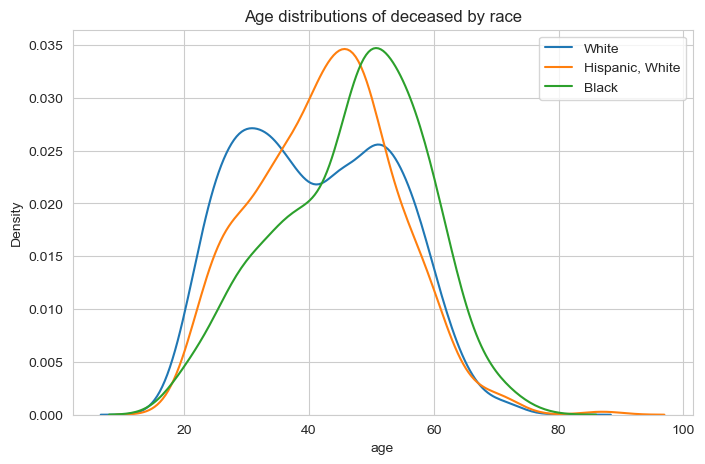

In [355]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(1, 1, figsize=[8, 5])
for race in data_drd['race'].unique():
    if sum(data_drd['race'] == race) > 100:
        sns.distplot(data_drd.loc[data_drd['race'] == race, 'age'], hist=False, label=race, ax=ax)
ax.set_title('Age distributions of deceased by race')
ax.autoscale()
ax.legend()
plt.show()


In [356]:
deaths_by_gender = deaths_by_drug.copy()
for gender in ['Male', 'Female']:
    temp_gender_df = data_drd.loc[data_drd['sex'] == gender, drug_types].sum().sort_values(ascending=False)
    temp_gender_df = 100 * temp_gender_df / sum(temp_gender_df)  # Change to a percentage
    deaths_by_gender = pd.DataFrame(deaths_by_gender).join(pd.DataFrame(temp_gender_df), rsuffix=gender)


In [357]:
deaths_by_race = deaths_by_drug.copy()
for race in ['White', 'Hispanic, White', 'Black']:
    temp_race_df = data_drd.loc[data_drd['race'] == race, drug_types].sum().sort_values(ascending=False)
    temp_race_df = 100 * temp_race_df / sum(temp_race_df)  # Change to a percentage
    deaths_by_race = pd.DataFrame(deaths_by_race).join(pd.DataFrame(temp_race_df), rsuffix=race)


/var/folders/g3/vnvm9bv503z9yknsv61s9m_80000gn/T/ipykernel_88985/1827114402.py:5: FutureWarning: Passing 'suffixes' which cause duplicate columns {'0'} in the result is deprecated and will raise a MergeError in a future version.
  deaths_by_race = pd.DataFrame(deaths_by_race).join(pd.DataFrame(temp_race_df), rsuffix=race)


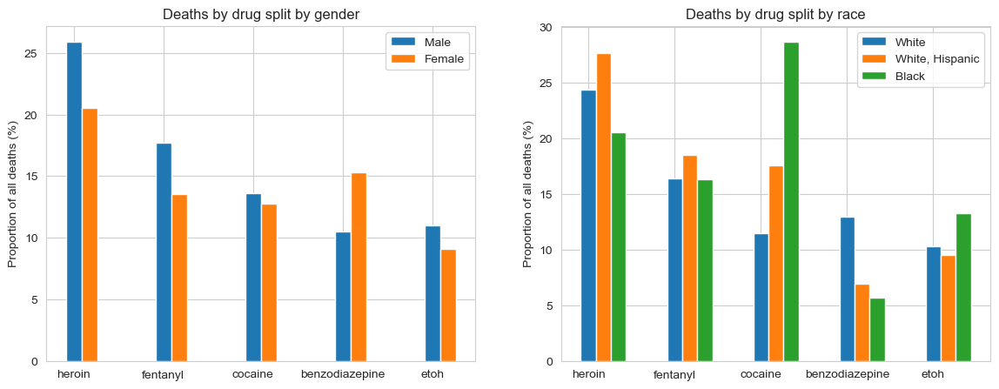

In [358]:
fig, (ax, ax1) = plt.subplots(1, 2, figsize=(14, 5))

N = len(deaths_by_gender.index[:5])
ind = np.arange(N)
width = 0.35

ax.bar(x=ind, 
       height=deaths_by_gender.iloc[:5, 1].values, 
       width=width/2, 
       label='Male')
ax.bar(x=ind + width/2, 
       height=deaths_by_gender.iloc[:5, 2].values, 
       width=width/2, 
       label='Female')
ax.set_xticks(ind)
ax.set_xticklabels(deaths_by_gender.index[:5])
ax.set_ylabel('Proportion of all deaths (%)')
ax.set_title('Deaths by drug split by gender')
ax.legend()

ax1.bar(x=ind, 
       height=deaths_by_race.iloc[:5, 1].values, 
       width=width/2, 
       label='White')
ax1.bar(x=ind + width/2, 
       height=deaths_by_race.iloc[:5, 2].values, 
       width=width/2, 
       label='White, Hispanic')
ax1.bar(x=ind + width, 
       height=deaths_by_race.iloc[:5, 3].values, 
       width=width/2, 
       label='Black')
ax1.set_xticks(ind)
ax1.set_xticklabels(deaths_by_race.index[:5])
ax1.set_ylabel('Proportion of all deaths (%)')
ax1.set_title('Deaths by drug split by race')
ax1.legend()

plt.show()


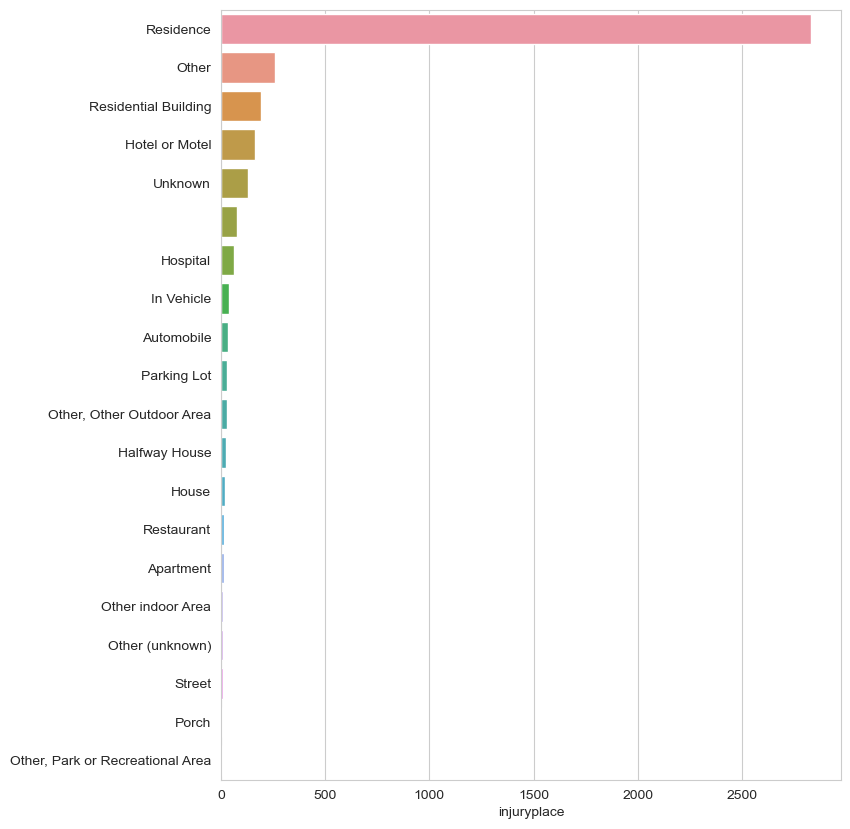

In [359]:
injury_places = data_drd['injuryplace'].value_counts()
fig, ax = plt.subplots(1, 1, figsize=[8, 10])
sns.barplot(x=injury_places[:20], y=injury_places[:20].index)
plt.show()


In [360]:
#data_understanding
df.info() 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1037 entries, 0 to 5972
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   _id                  1037 non-null   object        
 1   indicator            1037 non-null   object        
 2   panel                1037 non-null   object        
 3   panel_num            1037 non-null   int64         
 4   unit                 1037 non-null   object        
 5   unit_num             1037 non-null   int64         
 6   stub_name            1037 non-null   object        
 7   stub_name_num        1037 non-null   int64         
 8   stub_label           1037 non-null   object        
 9   stub_label_num       1037 non-null   float64       
 10  year                 1037 non-null   datetime64[ns]
 11  year_num             1037 non-null   int64         
 12  age                  1037 non-null   object        
 13  age_num              1037 non-nul

In [361]:
data_drd.describe()

,heroin,cocaine,fentanyl,oxycodone,oxymorphone,etoh,hydrocodone,benzodiazepine,methadone,amphet,tramad,morphine_(not_heroin),any_opioid,deathloc_latitude,deathloc_longitude,year
count,4081.000000,4081.000000,4081.000000,4081.000000,4081.000000,4081.000000,4081.000000,4081.000000,4081.000000,4081.000000,4081.000000,4081.000000,4081.000000,4081.000000,4081.000000,4079.000000
mean,0.525361,0.287430,0.357755,0.129870,0.023524,0.225435,0.025484,0.252144,0.094340,0.024994,0.022053,0.008576,0.168586,41.530331,-72.803925,2015.094631
std,0.499418,0.452619,0.479398,0.336202,0.151578,0.417920,0.157609,0.434297,0.292336,0.156125,0.146875,0.092222,0.374432,0.234867,0.389068,1.622660
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,41.026527,-73.628548,2012.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,41.316841,-73.057564,2014.000000
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,41.554260,-72.824944,2015.000000
75%,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,41.765774,-72.643791,2017.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,42.025993,-71.808899,2017.000000


In [362]:
# Style the DataFrame
styled_df_drd = data_drd.style.set_properties(**{'border': '1px solid black', 'border-collapse': 'collapse'}).set_table_styles([{'selector': 'th', 'props': [('border', '1px solid black')]}])

# Display styled DataFrame
styled_df_drd


In [363]:
# 1. Handle Missing Values
# Check for missing values
missing_values = data_drd.isnull().sum()
print("Missing values:")
print(missing_values)

Missing values:
_id                      0
casenumber               0
date                     2
sex                      0
race                     0
age                      0
residence_city           0
residence_state          0
residence_county         0
death_city               0
death_state              0
death_county             0
location                 0
descriptionofinjury      0
injuryplace              0
immediatecausea          0
heroin                   0
cocaine                  0
fentanyl                 0
oxycodone                0
oxymorphone              0
etoh                     0
hydrocodone              0
benzodiazepine           0
methadone                0
amphet                   0
tramad                   0
morphine_(not_heroin)    0
other                    0
any_opioid               0
mannerofdeath            0
amendedmannerofdeath     0
deathloc                 0
drug_type                0
deathloc_latitude        0
deathloc_longitude       0
year        

In [93]:
# 2. Handle Duplicate Records
# Check for duplicate rows
duplicate_rows = data_drd.duplicated().sum()
print("\nDuplicate rows:")
print(duplicate_rows)

# Remove duplicate rows
data_drd.drop_duplicates(inplace=True)



Duplicate rows:
0


In [94]:
# 3. Convert Data Types
# Check data types of columns
print("\nData types of columns:")
print(data_drd.dtypes)


Data types of columns:
_id                              object
casenumber                       object
date                     datetime64[ns]
sex                              object
race                             object
age                              object
residence_city                   object
residence_state                  object
residence_county                 object
death_city                       object
death_state                      object
death_county                     object
location                         object
descriptionofinjury              object
injuryplace                      object
immediatecausea                  object
heroin                             int8
cocaine                            int8
fentanyl                           int8
oxycodone                          int8
oxymorphone                        int8
etoh                               int8
hydrocodone                        int8
benzodiazepine                     int8
methadone       

Text(0.5, 1.0, 'Count of Deaths by Sex')

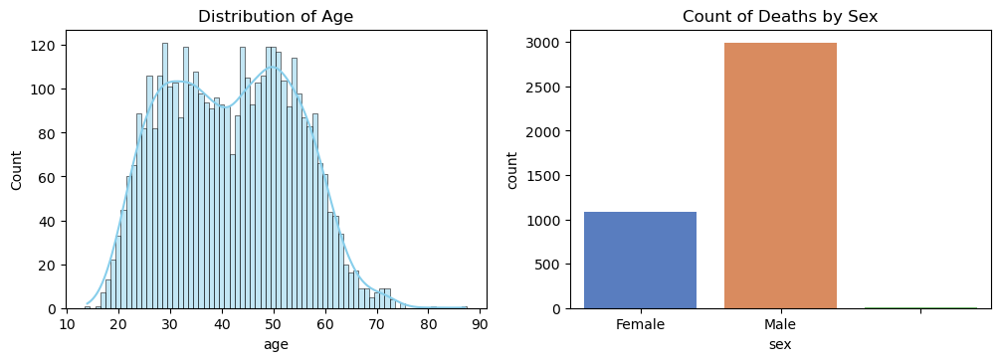

In [103]:

# Visualize the overall trends for the first 20 records
plt.figure(figsize=(12, 8))

# Plot 1: Distribution of Age
plt.subplot(2, 2, 1)
sns.histplot(data_drd['age'], bins=10, kde=True, color='skyblue')
plt.title('Distribution of Age')

# Plot 2: Count of Deaths by Sex
plt.subplot(2, 2, 2)
sns.countplot(data=data_drd, x='sex', palette='muted')
plt.title('Count of Deaths by Sex')




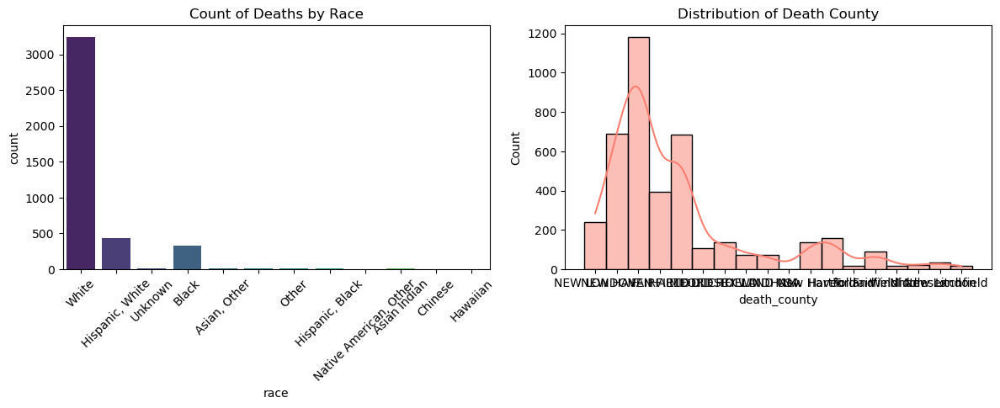

In [107]:
# Visualize the overall trends for the first 20 records
plt.figure(figsize=(12, 8))

# Plot 3: Count of Deaths by Race
plt.subplot(2, 2, 3)
sns.countplot(data=data_drd, x='race', palette='viridis')
plt.title('Count of Deaths by Race')
plt.xticks(rotation=45)

# Plot 4: Distribution of Death County
plt.subplot(2, 2, 4)
sns.histplot(data_drd['death_county'], bins=5, kde=True, color='salmon')
plt.title('Distribution of Death County')

plt.tight_layout()
plt.show()

#### Mongo DB To Postgres

In [236]:
import psycopg2

def create_database():
    conn = psycopg2.connect(
        user="dap",
        password="dap",
        host="localhost",  # This must match the Docker host or use the Docker's IP if needed
        port="5432",
        database="postgres"  # Connect to the default database to execute the creation command
    )
    conn.set_isolation_level(psycopg2.extensions.ISOLATION_LEVEL_AUTOCOMMIT)
    cur = conn.cursor()

    # Create the HealthcareAnalyst database
    cur.execute("CREATE DATABASE HealthcareAnalyst;")
    print("Database 'HealthcareAnalyst' created successfully.")

    cur.close()
    conn.close()

create_database()


Database 'HealthcareAnalyst' created successfully.


In [238]:
import psycopg2

def create_tables():
    # Connect to the new database to create tables
    conn = psycopg2.connect(
        user="dap",
        password="dap",
        host="127.0.0.1",
        port="5432",
        database="healthcareanalyst"
    )
    cur = conn.cursor()

    # SQL statements to create tables
    tables_creation_sql = [
        """CREATE TABLE DeathRelatedDrugHA (
            id SERIAL PRIMARY KEY,
            CaseNumber VARCHAR(50),
            Date DATE,
            Sex VARCHAR(10),
            Race VARCHAR(50),
            Age INT,
            ResidenceCity VARCHAR(255),
            ResidenceState VARCHAR(255),
            ResidenceCounty VARCHAR(255),
            DeathCity VARCHAR(255),
            DeathState VARCHAR(255),
            DeathCounty VARCHAR(255),
            Location VARCHAR(255),
            DescriptionOfInjury TEXT,
            InjuryPlace VARCHAR(255),
            ImmediateCauseA TEXT,
            Heroin CHAR(1),
            Cocaine CHAR(1),
            Fentanyl CHAR(1),
            Oxycodone CHAR(1),
            Oxymorphone CHAR(1),
            EtOH CHAR(1),
            Hydrocodone CHAR(1),
            Benzodiazepine CHAR(1),
            Methadone CHAR(1)
        );"""
    ]

    # Execute each command to create tables
    for sql_command in tables_creation_sql:
        cur.execute(sql_command)
    
    conn.commit()
    cur.close()
    conn.close()

    print("Tables created successfully.")

# Call the method to create tables
create_tables()


Tables created successfully.


In [274]:
import pymongo
import psycopg2
from datetime import datetime

def to_char(value):
    """Ensures that only valid 'Y' values are converted to 'Y', everything else defaults to 'N'."""
    return 'Y' if value.strip().upper() == 'Y' else 'N'

def convert_date(date_str):
    """Converts a date string from 'DD/MM/YYYY' to 'YYYY-MM-DD'."""
    try:
        return datetime.strptime(date_str, '%d/%m/%Y').strftime('%Y-%m-%d')
    except ValueError:
        return None  # Return None if date is invalid

def safe_int(value, default=0):
    """Converts a value to an integer or returns a default if conversion fails."""
    try:
        return int(value)
    except (ValueError, TypeError):
        return default

def transfer_data_from_mongodb_to_postgresql(mongo_db_name, mongo_collection_name, pg_user, pg_password, pg_host, pg_port, pg_db_name, pg_table_name):
    mongo_client = None
    pg_connection = None
    pg_cursor = None
    try:
        # Connect to MongoDB
        mongo_client = pymongo.MongoClient('mongodb://localhost:27017/')
        mongo_db = mongo_client[mongo_db_name]
        mongo_collection = mongo_db[mongo_collection_name]

        # Connect to PostgreSQL
        pg_connection = psycopg2.connect(
            user=pg_user,
            password=pg_password,
            host=pg_host,
            port=pg_port,
            database=pg_db_name
        )
        pg_cursor = pg_connection.cursor()

        # Query MongoDB collection
        cursor = mongo_collection.find()

        # Insert data into PostgreSQL
        num_inserted = 0
        for document in cursor:
            data_to_insert = (
                document.get('CaseNumber', ''),
                convert_date(document.get('Date', '')),
                document.get('Sex', ''),
                document.get('Race', ''),
                safe_int(document.get('Age')),  # Using safe_int to handle empty or invalid values
                document.get('ResidenceCity', ''),
                document.get('ResidenceState', ''),
                document.get('ResidenceCounty', ''),
                document.get('DeathCity', ''),
                document.get('DeathState', ''),
                document.get('DeathCounty', ''),
                document.get('Location', ''),
                document.get('DescriptionOfInjury', ''),
                document.get('InjuryPlace', ''),
                document.get('ImmediateCauseA', ''),
                to_char(document.get('Heroin', 'N')),
                to_char(document.get('Cocaine', 'N')),
                to_char(document.get('Fentanyl', 'N')),
                to_char(document.get('Oxycodone', 'N')),
                to_char(document.get('Oxymorphone', 'N')),
                to_char(document.get('EtOH', 'N')),
                to_char(document.get('Hydrocodone', 'N')),
                to_char(document.get('Benzodiazepine', 'N')),
                to_char(document.get('Methadone', 'N'))
            )
            insert_query = f"""
                INSERT INTO {pg_table_name} (CaseNumber, Date, Sex, Race, Age, ResidenceCity, ResidenceState, ResidenceCounty, DeathCity, DeathState, DeathCounty, Location, DescriptionOfInjury, InjuryPlace, ImmediateCauseA, Heroin, Cocaine, Fentanyl, Oxycodone, Oxymorphone, EtOH, Hydrocodone, Benzodiazepine, Methadone)
                VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
            """
            pg_cursor.execute(insert_query, data_to_insert)
            num_inserted += 1

        # Commit the transaction
        pg_connection.commit()
        
        print("Data successfully transferred from MongoDB to PostgreSQL.")
        print(f"Number of rows inserted into PostgreSQL: {num_inserted}")

    except Exception as e:
        print(f"Error while transferring data: {str(e)}")
    finally:
        # Properly close all connections and cursors
        if pg_cursor:
            pg_cursor.close()
        if pg_connection:
            pg_connection.close()
        if mongo_client:
            mongo_client.close()

# Example usage
transfer_data_from_mongodb_to_postgresql(
    mongo_db_name='HealthCare',
    mongo_collection_name='DeathRelatedDrug',
    pg_user='dap',
    pg_password='dap',
    pg_host='127.0.0.1',
    pg_port='5432',
    pg_db_name='healthcareanalyst',
    pg_table_name='deathrelateddrugha'
)

Data successfully transferred from MongoDB to PostgreSQL.
Number of rows inserted into PostgreSQL: 4081


In [291]:
pip install pandas sqlalchemy psycopg2


Note: you may need to restart the kernel to use updated packages.


In [292]:
from sqlalchemy import create_engine
import pandas as pd

# Set up the connection to PostgreSQL using SQLAlchemy
username = 'dap'
password = 'dap'
host = '127.0.0.1'
port = '5432'
database = 'healthcareanalyst'

# Create the connection URL
connection_url = f"postgresql://{username}:{password}@{host}:{port}/{database}"
engine = create_engine(connection_url)

